<a href="https://colab.research.google.com/github/MarkoArsenovic/PPPO2021/blob/main/Vezbe03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Vežbe 03** Restauracija fotografija

## Sadržaj

1.   Uvod
2.   *Wiener* filter
3.   Filter ograničenih najmanjih kvadrata
4.   Restauracija fotografije sa šumom pomoću *Markov Random Field*
5.    “Slikanje fotografije” pomoću *OpenCV-Python* 
6.   “Slikanje fotografije” pomoću konveksne optimizacije
7.   Steganografija i steganaliza
8.   Restauracija fotografije pomoću *Dictionary Learning*
9.  Kompresija (sabijanje) fotografije pomoću *Wavelets*

### Uvod

Restauracija fotografije je tehnika obrade fotografije, koja pokušava oporaviti oštećenu fotografiju modeliranjem procesa degradacije uz prethodno znanje (na primer, pretpostavlja se da je filter degradacije poznat u većini slučajeva). 

Zatim poboljšava fotografiju primenom inverznog postupka za vraćanje originalne fotografije. Za razliku od tehnika poboljšanja fotografije, u obnavljanju fotografije modelira se degradacija. Ovo omogućava uklanjanje efekata degradacije (u velikoj meri). Izazov je gubitak informacija i šuma.

Sledeći dijagram prikazuje osnovni model degradacije fotografije, gde se pretpostavlja da je posmatrana (degradirana) fotografija zbir originalne (bešumne) fotografije uvijene u jezgro degradacije i aditivnu komponentu šuma:


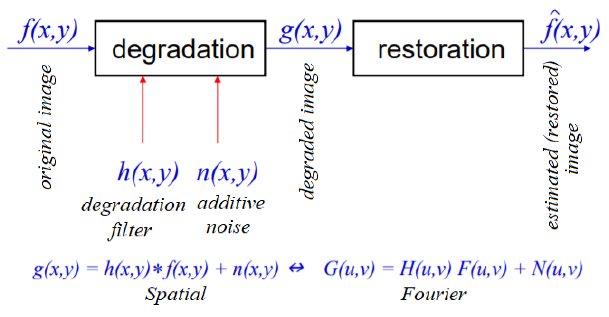

Učitavanje dataseta potrebnog za ove vežbe
- učitati images.zip

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1TXBQchO9hT2Oc6hsyy4oyuNig-QL6sy5' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1TXBQchO9hT2Oc6hsyy4oyuNig-QL6sy5" -O images.zip && rm -rf /tmp/cookies.txt

--2021-03-15 19:05:37--  https://docs.google.com/uc?export=download&confirm=0ry6&id=1TXBQchO9hT2Oc6hsyy4oyuNig-QL6sy5
Resolving docs.google.com (docs.google.com)... 173.194.202.139, 173.194.202.100, 173.194.202.113, ...
Connecting to docs.google.com (docs.google.com)|173.194.202.139|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-08-78-docs.googleusercontent.com/docs/securesc/gvg62shrd8oo1slgv33ui34kjom24q96/4bvt10uoi4vf7n0vf7cupt0vu1h9mkl0/1615835100000/07050430151874469418/16256758748586961914Z/1TXBQchO9hT2Oc6hsyy4oyuNig-QL6sy5?e=download [following]
--2021-03-15 19:05:37--  https://doc-08-78-docs.googleusercontent.com/docs/securesc/gvg62shrd8oo1slgv33ui34kjom24q96/4bvt10uoi4vf7n0vf7cupt0vu1h9mkl0/1615835100000/07050430151874469418/16256758748586961914Z/1TXBQchO9hT2Oc6hsyy4oyuNig-QL6sy5?e=download
Resolving doc-08-78-docs.googleusercontent.com (doc-08-78-docs.googleusercontent.com)... 173.194.202.132, 2607:f8b0:400e:c00::84
Conne

Unzip dataseta

In [ ]:
!unzip images.zip

Archive:  images.zip
   creating: images/
  inflating: images/book.png         
  inflating: images/book_restored.png  
  inflating: images/building.png     
  inflating: images/butterfly.jpg    
  inflating: images/butterfly.png    
  inflating: images/cactus.png       
  inflating: images/cameraman.png    
  inflating: images/cameraman_D8.png  
  inflating: images/car.png          
  inflating: images/cat.png          
  inflating: images/cat_mask.png     
  inflating: images/cls.png          
  inflating: images/cls_gauss_noisy_freq_all.png  
  inflating: images/cls_out.png      
  inflating: images/dict.png         
  inflating: images/dict_1_100.png   
  inflating: images/dict_2_027.png   
  inflating: images/dict_2_127.png   
  inflating: images/dict_learn.png   
  inflating: images/dict_out1.png    
  inflating: images/dict_out2_omp.png  
  inflating: images/earth_from_sky.png  
  inflating: images/face_completion_out.png  
  inflating: images/image_completion.png  
  inflating:

### Wiener Filter

*Wiener* filter je filter srednje kvadratne greške (MSE), koji uključuje i funkciju razgradnje i statističke karakteristike šuma. Osnovna pretpostavka je da šum i fotografija nisu povezani. Optimizira filter tako da je MSE minimalizovan. Primena *Wiener* filter podrazumeva korišćenje funkcije iz modula *scikit-image*.

Dijagram pokazuje kako se može izračunati *Wiener* filter. Kao što se može videti, *Wiener* filter je filter koji ima za cilj funkciju minimiziranja MSE između obnovljene i originalne fotografije. *Wiener* filter se smanjuje na inverzni filter kada se na ulaznu fotografiju ne doda šum (N = 0). Ovde je K konstanta (to jest, ne zavisi od u, v), koja se bira prema predznanju o šumu.

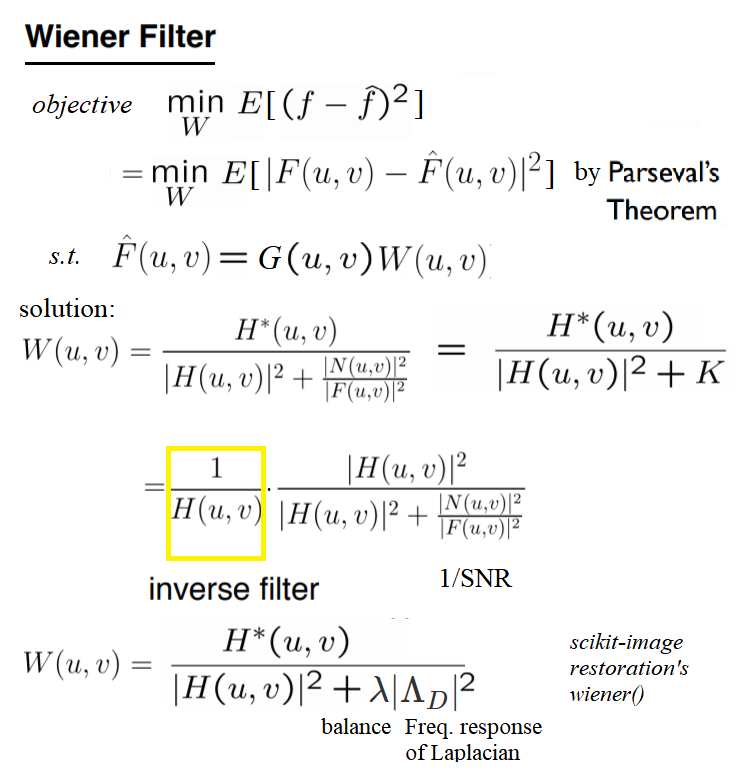

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:73: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:74: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


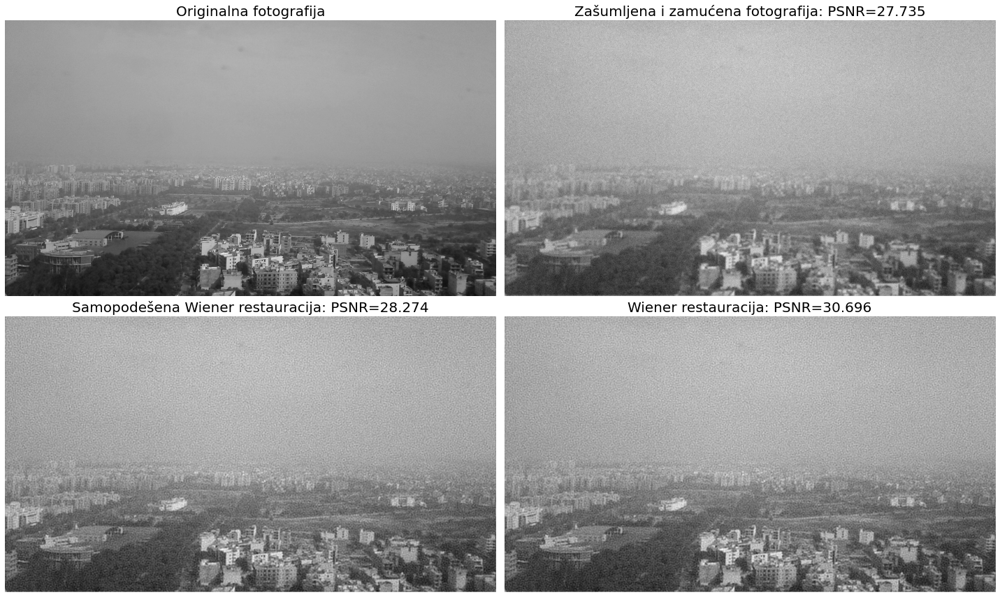

'\nKao što možete videti iz primera, Wiener-ova restauracija sa\nparametrom ravnoteže ima bolje performanse od unsupervised Wiener-ove restauracije.\nIzmerili smo vraćeni kvalitet fotografije pomoću Peak Signal-to-Noise Ratio\n(PSNR) tehnike.\n'

In [ ]:
# Učitavanje potrebnih biblioteka
%matplotlib inline
from skimage import color, data, restoration
import scipy.fftpack as fp
from skimage.measure import compare_psnr
from skimage.io import imread
import numpy as np
import matplotlib.pylab as plt
from matplotlib.ticker import LinearLocator, FormatStrFormatter

# 1. Učitajte fotografiju i pretvorite je u grayscale fotografiju (fotografiju sivih nijansi):
im = color.rgb2gray(imread('images/earth_from_sky.png'))

# 2.
"""
Definišite convolve2d() za primenu konvolucije u frekvencijskom domenu
(prema teoremi o konvoluciji, ova implementacija radi mnogo brže nego onaj u prostornom domenu). 
Konstruisati 7x7 prosečno (zamućenje okvira) širenje tačke 
funkciju i koristite je kao convolution-kernel da biste zamutili sliku:
"""
def convolve2d(im, psf, k):
    M, N = im.shape
    freq = fp.fft2(im)
    psf = np.pad(psf, (((M-k)//2,(M-k)//2+1), ((N-k)//2,(N-k)//2+1)), mode='constant') # assumption: min(M,N) > k > 0, k odd
    freq_kernel = fp.fft2(fp.ifftshift(psf))
    return np.abs(fp.ifft2(freq*freq_kernel))

def plot_freq_filter(F, title, size=20):
    plt.imshow(20*np.log10( 0.01 + np.abs(fp.fftshift(F))), cmap='coolwarm'), plt.title(title, size=size), plt.colorbar()


k = 5
psf = np.ones((k, k)) / k**2
im1 = convolve2d(im, psf, k)

# 3. Zamućenoj fotografiji  dodajte šum da biste dobili fotografiju lošijeg kvaliteta:
im1 += 0.3 * im.std() * np.random.standard_normal(im.shape)

# 4. 
"""
Primenite unsupervised Wiener-ov filter na fotografiju lošijeg kvaliteta zajedno sa
kernelom(jezgrom) kao ulazom za vraćanje fotografije:
"""
im2, _ = restoration.unsupervised_wiener(im1, psf)
# 5. 
"""
Primenite Wiener-ov filter (ovaj put sa parametrom ravnoteže) na fotografije 
lošijeg kvaliteta zajedno sa kernelom(jezgrom) kao ulazom za vraćanje fotografije:
"""
im3 = restoration.wiener(im1, psf, balance=0.25)

# 6. 
"""
Iscrtavanje frekvencijskog spektra ulaznih/izlaznih fotografija
i (kernela) jezgra u 3 dimenzije:
"""
def plot_freq_spec_3d(freq):
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection='3d')
    Y = np.arange(-freq.shape[0]//2,freq.shape[0]-freq.shape[0]//2)
    X = np.arange(-freq.shape[1]//2,freq.shape[1]-freq.shape[1]//2)
    X, Y = np.meshgrid(X, Y)
    Z = (20*np.log10( 0.01 + fp.fftshift(freq))).real
    surf = ax.plot_surface(X, Y, Z, cmap=plt.cm.coolwarm,
                           linewidth=0, antialiased=True)
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    plt.show()

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 12), sharex=True, sharey=True)
plt.gray()
axes[0,0].imshow(im), axes[0,0].axis('off'), axes[0,0].set_title('Originalna fotografija', size=20)
axes[0,1].imshow(im1), axes[0,1].axis('off'), axes[0,1].set_title('Zašumljena i zamućena fotografija: PSNR={:.3f}'.format(compare_psnr(im, im1)), size=20)
axes[1,0].imshow(im2), axes[1,0].axis('off'), axes[1,0].set_title('Samopodešena Wiener restauracija: PSNR={:.3f}'.format(compare_psnr(im, im2)), size=20)
axes[1,1].imshow(im2), axes[1,1].axis('off'), axes[1,1].set_title('Wiener restauracija: PSNR={:.3f}'.format(compare_psnr(im, im3)), size=20)
fig.tight_layout()
plt.show()

"""
Kao što možete videti iz primera, Wiener-ova restauracija sa
parametrom ravnoteže ima bolje performanse od unsupervised Wiener-ove restauracije.
Izmerili smo vraćeni kvalitet fotografije pomoću Peak Signal-to-Noise Ratio
(PSNR) tehnike.
"""

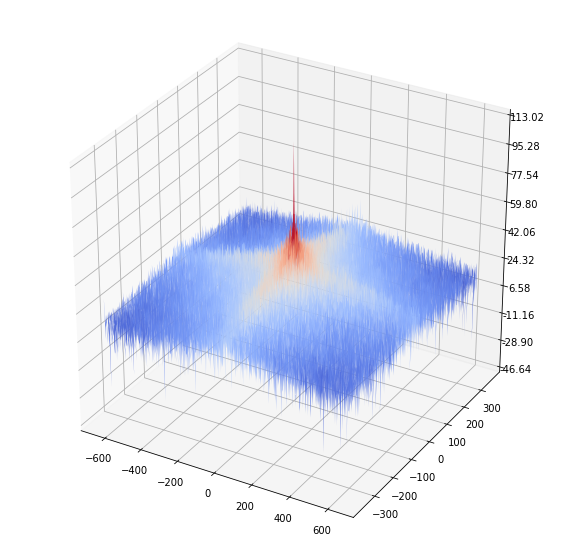

In [ ]:
plot_freq_spec_3d(fp.fft2(im))

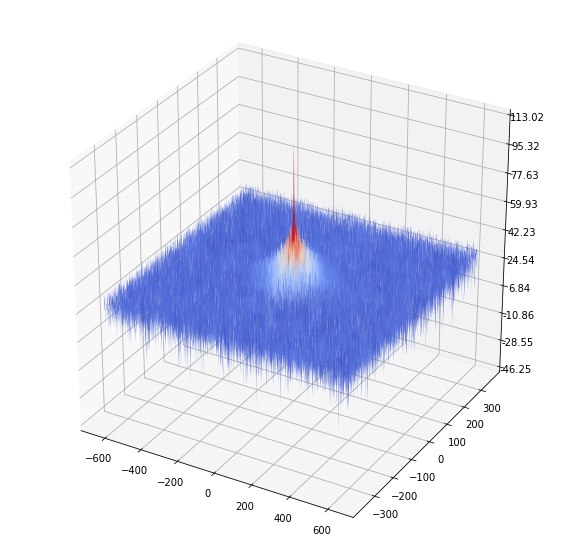

In [ ]:
plot_freq_spec_3d(fp.fft2(im1))

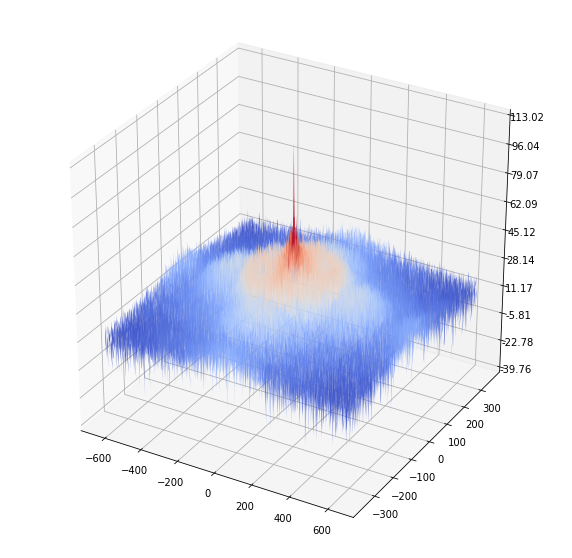

In [ ]:
plot_freq_spec_3d(fp.fft2(im2))

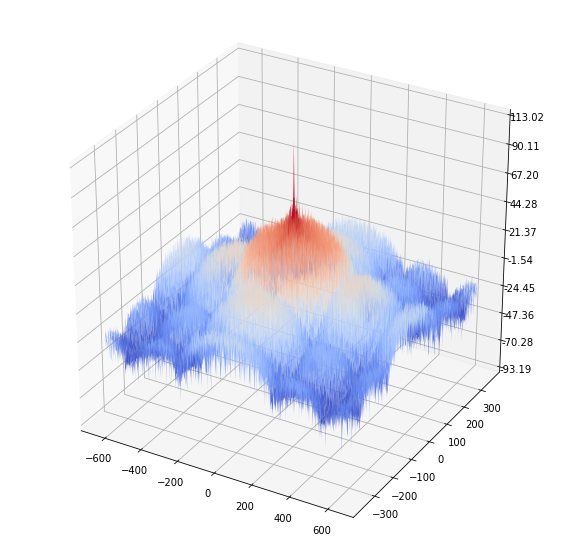

In [ ]:
plot_freq_spec_3d(fp.fft2(im3))

### Constrained Least Squares (CLS) Filter // Filter ograničenih najmanjih kvadrata

Filter ograničenih najmanjih kvadrata (CLS) u domenu frekvencija je inverzni filter sa dodatnim ograničenjem glatkoće koji ne dozvoljava proizvoljno kolebanje visoke frekvencije na obnovljenoj fotografiji nametanjem ograničenja glatkoće. 
Moguće je uporediti kvalitete obnovljenih slika koristeći različite implementacije filtera u frekvencijskom domenu kao što su inverzna, Wiener i CLS.

Sledeći dijagram pokazuje kako izračunati CLS filter i pomoću njega vratiti degradiranu sliku u frekvencijskom domenu:


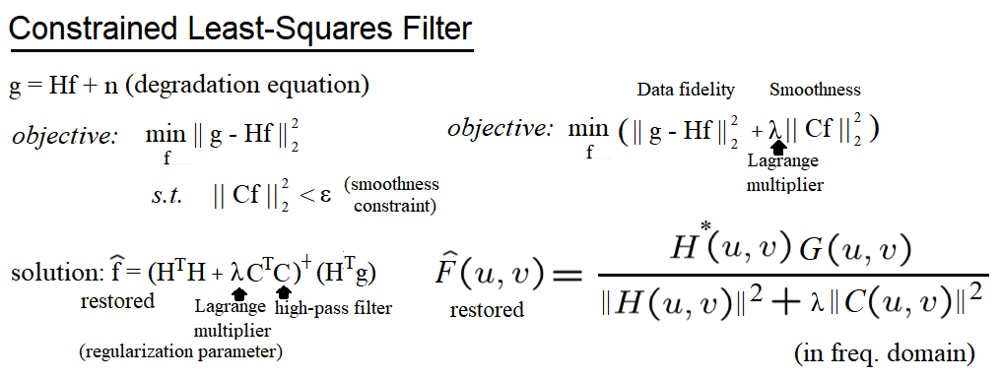

Parametar λ kontroliše stepen glatkosti - što je veća vrednost, fotografija će biti glatka.
Sa λ = 0 CLS filter postaje inverzni filter.

Funkcija *cls_filter()* je korišćena za stvarno sprovođenje CLS filtera. Prihvata degradiranu fotografiju, zamagljeno jezgro, visokopropusni filter ograničenja (Laplasijevo jezgro) i parametar regularizacije λ kao ulaz i vraća obnovljenu fotografiju zajedno sa frekvencijskim odzivom CLS filtera.

(720, 540)
1.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:73: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:91: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py

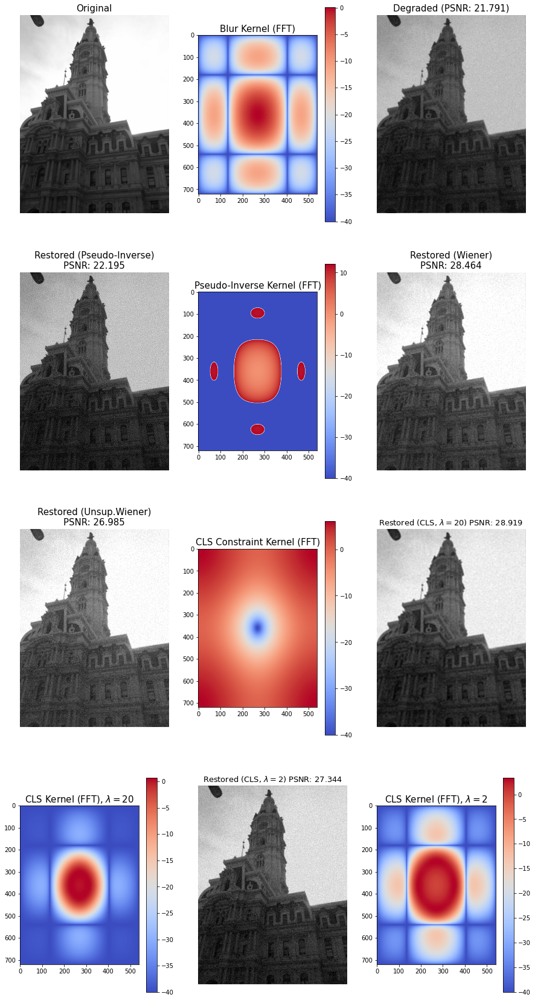

'\nKao što vidite iz prethodnog rezultata, CLS filter (sa većim vrednostima λ)\ni wiener filter imaju prilično dobre performanse u pogledu kvaliteta slike\nobnovljena\n'

In [ ]:
import numpy as np
import scipy.fftpack as fp
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.restoration import wiener, unsupervised_wiener
from skimage.measure import compare_psnr
import matplotlib.pylab as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import FormatStrFormatter

def pseudo_inverse_filter(y, h, epsilon):
    '''
    Hinv(u,v) = 1/H(u,v)   if |H(u,v)| > epsilon
                0          otherwise
    '''
    Hf = fp.fft2(fp.ifftshift(h))
    M, N = Hf.shape
    Hf[(np.abs(Hf)<epsilon)] = 0
    indices = np.where((np.abs(Hf)>=epsilon))
    Hf[indices] = np.ones((M,N))[indices] / Hf[indices]
    Yf = fp.fft2(y)
    I = Yf*Hf 
    im = np.abs(fp.ifft2(I))
    return (im, Hf)

# 1.
"""
Prvo definišite funkciju cls_filter() da biste implementirali constrained least
squares (najmanje ograničeni kvadratni) filter:
"""
def cls_filter(y,h,c,lambd):
    Hf = fp.fft2(fp.ifftshift(h))
    Cf = fp.fft2(fp.ifftshift(c))
    Hf = np.conj(Hf) / (Hf*np.conj(Hf) + lambd*Cf*np.conj(Cf))
    #Hf = np.abs(Hf)**2 / (np.abs(Hf)**2 + lambd*np.abs(Cf)**2)
    Yf = fp.fft2(y)
    I = Yf*Hf 
    im = np.abs(fp.ifft2(I))
    return (im, Hf) 

# 2.
"""
Učitajte ulaznu fotografiju i pretvorite je u fotografiju sivih nijansi(grayscale). 
Zamuti ulaznu grayscale fotografiju koristeći box-kernel 
(u frekvencijskom domenu) i smanjiti kvalitet fotografije (degradirati fotografiju)
koristeći White Gaussian Noise (WGN) sa datom standardnom devijacijom (σ):
"""
x = rgb2gray(imread('images/building.png'))
print(x.shape)
M, N = x.shape
h = np.ones((4,4))/16
h = np.pad(h, [(M//2-2, M//2-2), (N//2-2, N//2-2)], mode='constant')
sigma = 0.075

Xf = fp.fft2(x)
Hf = fp.fft2(fp.ifftshift(h))
Y = Hf*Xf
y = fp.ifft2(Y).real + sigma*np.random.normal(size=(M,N))
print(np.max(x))

plt.figure(figsize=(15,30))

plt.subplot(431), plt.imshow(x, cmap='gray'), plt.axis('off'), plt.title('Original', size=15)

# Blur the image, corrupt the image using WGN and display it
# h is the blurring filter, and sigma is the noise std



plt.subplot(432), plt.imshow(20*np.log10( 0.01 + np.abs(fp.fftshift(Hf))), cmap='coolwarm'), plt.title('Blur Kernel (FFT)', size=15), plt.colorbar()


plt.subplot(433), plt.imshow(np.abs(y), cmap='gray'), plt.axis('off'), plt.title('Degraded (PSNR: {})'.format(np.round(compare_psnr(x, y),3)), size=15)

# 3.
"""
Primenite pseudo_inverse filter na degradiranu fotografiju da biste vratili
restauriranu fotografiju zajedno sa frekvencijskim odzivom pseudo-inverznog filtera:
"""
epsilon = 0.25
pix, F_pseudo = pseudo_inverse_filter(y, h, epsilon)
plt.subplot(434), plt.imshow(pix, cmap='gray'), plt.axis('off'), plt.title('Restored (Pseudo-Inverse)\nPSNR: {}'.format(np.round(compare_psnr(x, pix),3)), size=15)
plt.subplot(435), plot_freq_filter(F_pseudo, 'Pseudo-Inverse Kernel (FFT)', size=15)

# 4. 
"""
Primenite wiener filter sa parametrom ravnoteže 0,25 da vratite
restauriranu fotografiju:
"""
wx = wiener(y, h, balance=0.25)
plt.subplot(436), plt.imshow(wx, cmap='gray'), plt.axis('off'), plt.title('Restored (Wiener)\nPSNR: {}'.format(np.round(compare_psnr(x, wx),3)), size=15)

# 5.
"""
Primenite unsupervised_wiener filter da vratite
restauriranu fotografiju:
"""
uwx, _ = unsupervised_wiener(y, h)
plt.subplot(437), plt.imshow(uwx, cmap='gray'), plt.axis('off'), plt.title('Restored (Unsup.Wiener)\nPSNR: {}'.format(np.round(compare_psnr(x, uwx),3)), size=15)

# 6.
"""
Napravite visokopropusni(high-pass) filter (2D Laplacian) 
i pretvorite ga u frekvenciju domena, koristeći ga kao constraint-kernel. 
Primenite CLS filter na degradirane fotografije koja koristi stvoreno jezgro ograničenja, 
zajedno sa parametrom regularizacije (λ) vrednost:
"""
c =  np.array([[0,1/4,0],[1/4,-1,1/4],[0,1/4,0]])
c = np.pad(c, [(M//2-1, M//2-2), (N//2-2, N//2-1)], mode='constant')
Cf = fp.fft2(fp.ifftshift(c))
plt.subplot(438), plt.imshow(20*np.log10( 0.01 + np.abs(fp.fftshift(Cf))), cmap='coolwarm'), plt.title('CLS Constraint Kernel (FFT)', size=15), plt.colorbar()
lambd = 20
clx, F_restored = cls_filter(y, h, c, lambd)
plt.subplot(439), plt.imshow(clx, cmap='gray'), plt.axis('off'), plt.title(r'Restored (CLS, $\lambda=${}) PSNR: {}'.format(lambd, np.round(compare_psnr(x, clx),3)), size=13)
plt.subplot(4,3,10), plot_freq_filter(F_restored, r'CLS Kernel (FFT), $\lambda=${}'.format(lambd), size=15)
lambd = 2
clx, F_restored = cls_filter(y, h, c, lambd)
plt.subplot(4,3,11), plt.imshow(clx, cmap='gray'), plt.axis('off'), plt.title(r'Restored (CLS, $\lambda=${}) PSNR: {}'.format(lambd, np.round(compare_psnr(x, clx),3)), size=13)
plt.subplot(4,3,12), plot_freq_filter(F_restored, r'CLS Kernel (FFT), $\lambda=${}'.format(lambd), size=15)

plt.show()

"""
Kao što vidite iz prethodnog rezultata, CLS filter (sa većim vrednostima λ)
i wiener filter imaju prilično dobre performanse u pogledu kvaliteta slike
obnovljena
"""

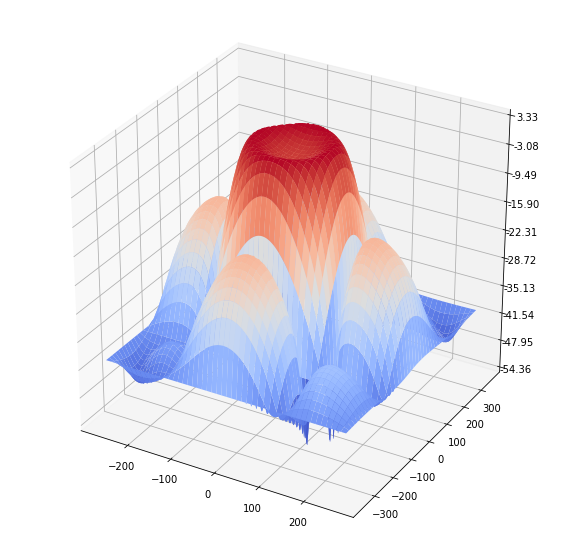

In [ ]:
# Štampamo frekvencijske odzive jezgra (kernela) u 3D:      
plot_freq_spec_3d(F_restored)

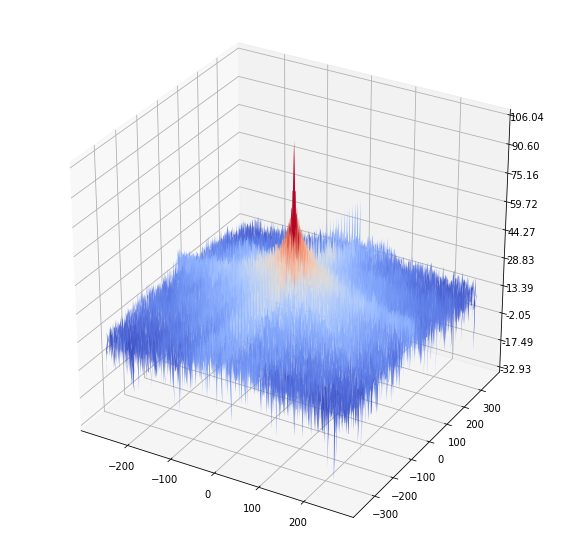

In [ ]:
plot_freq_spec_3d(fp.fft2(x))

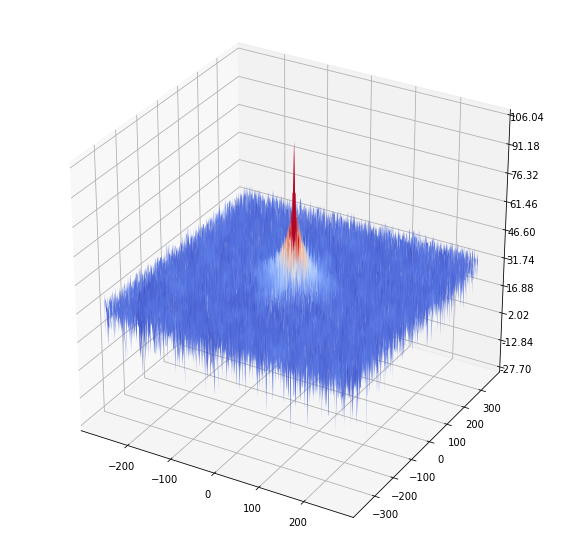

In [ ]:
plot_freq_spec_3d(fp.fft2(y))

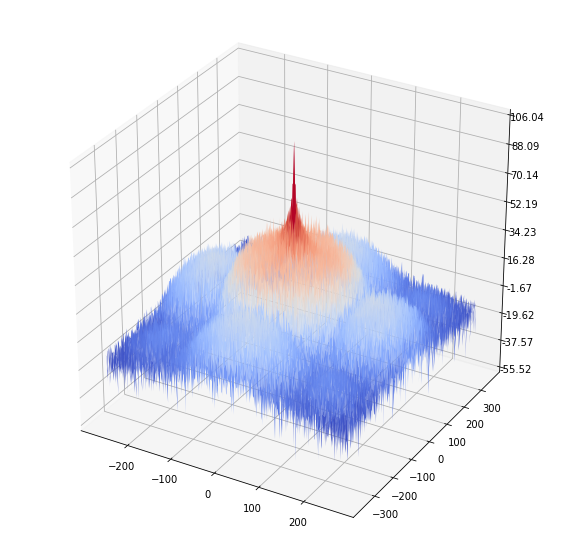

In [ ]:
plot_freq_spec_3d(fp.fft2(clx))

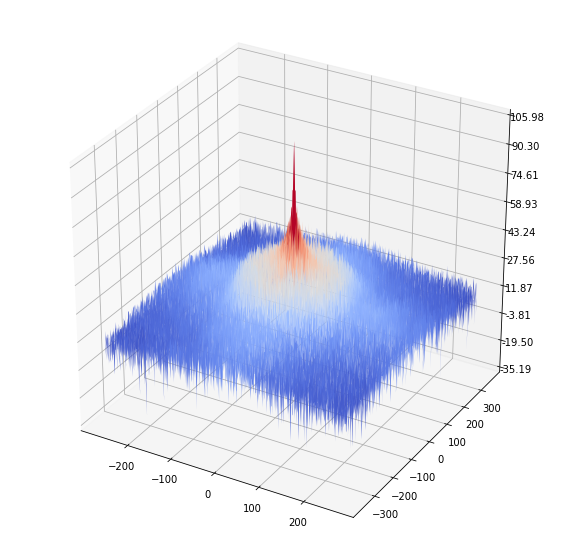

In [ ]:
plot_freq_spec_3d(fp.fft2(uwx))

### Noisy Image Restoration with Markov Random Field // Restauracija fotografije sa šumom pomoću *Markov Random Field*

Dijagram predstavlja model MRF-a, koji se koristi za restauraciju fotografije sa šumom.

Posmatramo binarnu fotografiju sa šumom, *X*, sa vrednostima piksela *Xij ∈ {-1, +1}* i *Y*,  fotografiju bez šuma. Ako se pretpostavi da je količina šuma mala, biće dobra korelacija između piksela u *X* i odgovarajućeg piksela u *Y* i u 4-povezanom susedstvu, pikseli *X* će biti dobro povezani.

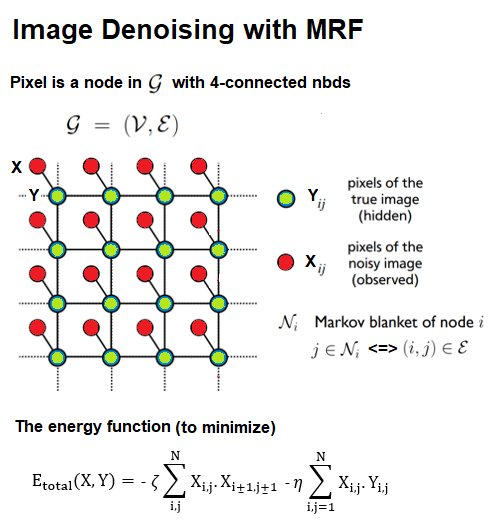

Koristićemo *grayscale* fotografiju i prvo ćemo joj dodati šum. Nakon toga ćemo koristit MFR model da bismo restaurirali fotografiju minimiziranjem energetske funkcije.

Funkcija *compute_energy()* uzima lokaciju određenog piksela kao ulaz i izračunava energiju za različite vrednosti izlaznog piksela. Postoje dve vrste energija:

*   Prva ostaje niska (negativna) kada se ulazne i izlazne vrednosti piksela podudaraju za tu određenu lokaciju, u suprotnom prelazi u visoke. Parametar η se koristi za pojačavanje ove energije. 
*   Druga ostaje niska (negativna) ako se vrednost piksela na ulaznoj fotografiji sa šumom poklapa sa vrednostima susedstva, u suprotnom, prelazi se u visoko. Parametar ς koristi se za pojačavanje ove energije.

U svakoj iteraciji smanjenja šuma, slučajno se bira lokacija piksela i na toj lokaciji na izlaznoj fotografije odabere se vrednost piksela koja minimizira energiju para fotografija. Sledeći snimak ekrana prikazuje kako se energija smanjuje kroz iteracije smanjenja šuma:


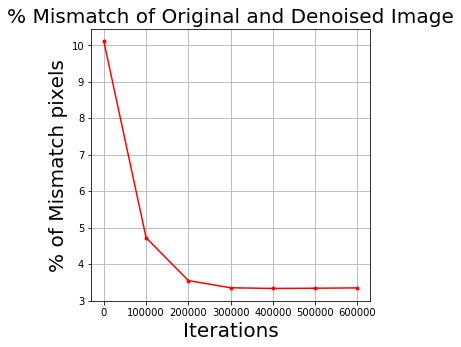

Completed 0 iterations out of 655360
Completed 100000 iterations out of 655360
Completed 200000 iterations out of 655360
Completed 300000 iterations out of 655360
Completed 400000 iterations out of 655360
Completed 500000 iterations out of 655360
Completed 600000 iterations out of 655360


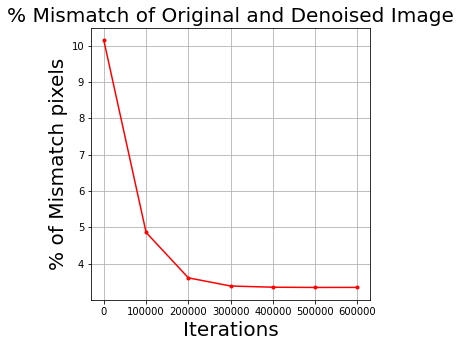

Percentage of mismatched pixels:  3.35235595703125


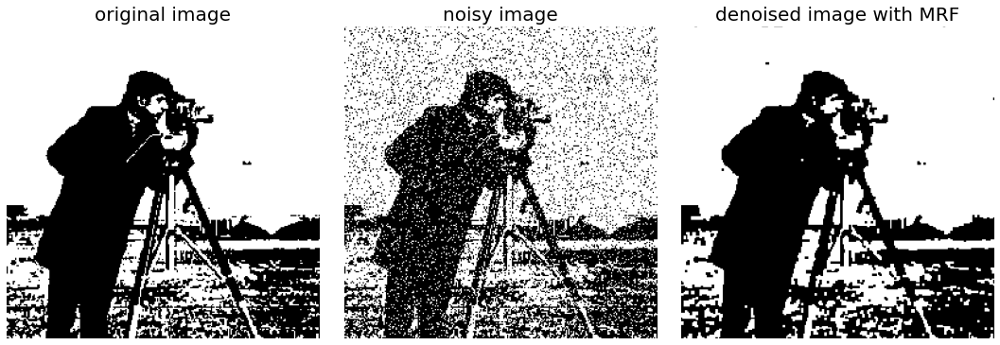

In [ ]:
% matplotlib inline
import numpy as np
from skimage.color import rgb2gray
import matplotlib.pylab as plt

"""
Implementiramo funkciju read_image_and_binarize() 
za čitanje i binarizovanje fotografije (kao korak pred-procesiranja). 
Binarna fotografija je na izlazu sa vrednostima piksela od {-1, 1}:
"""
def read_image_and_binarize(image_file, threshold=128):
  im = (255*rgb2gray(plt.imread(image_file))).astype(int)
  im[im < threshold] = -1
  im[im >= threshold] = 1
  return im

"""
Primenimo funkcije compute_energy_helper() za izračunavanje
energije u funkciji koja ima ulaznu fotografiju šuma X, 
a za rezultujuću, Y, fotografiju kojoj je otklonjen šum.
"""
def compute_energy_helper(Y, i, j):
  try:
    return Y[i][j]
  except IndexError:
    return 0

def compute_energy(X, Y, i, j, zeta, eta, Y_i_j):
  energy = -eta * X[i][j] * Y_i_j #np.sum(X*Y) #
  for (k, l) in [(-1,0),(1,0),(0,-1),(0,1)]:
      energy -= zeta * Y_i_j * compute_energy_helper(Y, i+k, j+l)
  return energy

"""
Implementiramo funkciju za dodavanje šuma na fotografiju. 
Ova funkcija obično dodaje 10% šuma na fotografiju.
"""
def add_noise(im):
  im_noisy = im.copy()
  for i in range(im_noisy.shape[0]):
    for j in range(im_noisy.shape[1]):
      r = np.random.rand()
      if r < 0.1:
        im_noisy[i][j] = -im_noisy[i][j]
  return im_noisy

"""
Funkcija, denoise_image(), se bavi otklanjanjem šuma fotografija iterativno 
(obično se izvodi za nekoliko iteracija jednakih 10 puta većoj od veličine fotografije):
"""
def denoise_image(O, X, zeta, eta):
  m, n = np.shape(X)
  Y = np.copy(X)
  max_iter = 10*m*n
  iters = []
  errors = []
  for iter in range(max_iter):
    # randomly pick a location
    i = np.random.randint(m)
    j = np.random.randint(n)
    # računa energiju za Y_ij = +1 i -1
    energy_neg = compute_energy(X, Y, i, j, zeta, eta, -1)
    energy_pos = compute_energy(X, Y, i, j, zeta, eta, 1)
    # dodeljuje minimalnu energiju Y_ij
    if energy_neg < energy_pos:
      Y[i][j] = -1
    else:
      Y[i][j] = 1
    if iter % 100000 == 0:
        print ('Completed', iter, 'iterations out of', max_iter)
        error = get_mismatched_percentage(O, Y)
        iters.append(iter)
        errors.append(error)
  plot_error(iters, errors)
  
  return Y

def get_mismatched_percentage(orig_image, denoised_image):
  diff = (orig_image != denoised_image)
  return (100.0 * np.sum(diff)) / np.size(orig_image)

def plot_image(im, title):
  im = im.copy()
  im[im==-1] = 0
  im[im==1] = 255
  plt.imshow(im), plt.axis('off'), plt.title(title, size=20)

def plot_error(iters, errors):
    plt.figure(figsize=(5,5))
    plt.plot(iters, errors, 'r.-')
    plt.xlabel('Iterations', size=20)
    plt.ylabel('% of Mismatch pixels', size=20)
    plt.title('% Mismatch of Original and Denoised Image', size=20)
    plt.grid()
    plt.show()

def plot_images(orig_image, noisy_image, denoised_image):
    plt.figure(figsize=(15,5))
    plt.gray()
    plt.subplot(131), plot_image(orig_image, 'original image')
    plt.subplot(132), plot_image(noisy_image, 'noisy image')
    plt.subplot(133), plot_image(denoised_image, 'denoised image with MRF')
    plt.tight_layout()
    plt.show()

"""
Pozovite  za čitanje i binarizaciju ulazne fotografije, 
dodajte 10% šuma na fotografiju, zatim rekonstruišite fotografiju pomoću MRF-a 
uz minimizaciju energije koristeći ranije definisane funkcije, 
nakon inicijalizacije parametara zeta i eta:
"""
orig_image = read_image_and_binarize('images/cameraman.png')
zeta = 1.5
eta = 2

# add noise
noisy_image = add_noise(orig_image)

# use ICM for denoising
denoised_image = denoise_image(orig_image, noisy_image, zeta, eta)

# print the percentage of mismatched pixels
print ('Percentage of mismatched pixels: ', get_mismatched_percentage(orig_image, denoised_image))

plot_images(orig_image, noisy_image, denoised_image)

### Image Inpainting with opencv-python //  “Slikanje fotografije” pomoću *OpenCV-Python*


*Inpainting* je postupak obnavljanja oštećenih ili nedostajućih delova fotografije. Pretpostavimo da imamo binarnu ulaznu fotografiju, *D*, koja određuje mesto oštećenih piksela na ulaznoj fotografiji, f, kao što je prikazano u sledećoj jednačini:

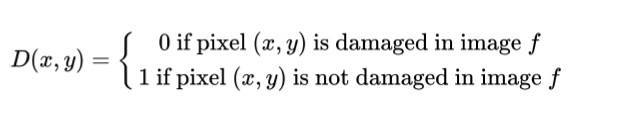

Jednom kada se oštećena područja na fotografiji pronađu sa maskom, izgubljeni/oštećeni pikseli moraju se rekonstruisati pomoću nekog algoritma. Rekonstrukcija bi trebalo da se izvede potpuno automatski korišćenjem informacija predstavljenih u neoštećenim regionima. 
Za ovu rekonstrukciju koristićemo funkcije biblioteke *OpenCV-Python* za primenu *inpainting*-a, koristeći dva različita algoritma.

Funkcija *cv2.inpaint()* koristi se za oslikavanje nedostajućih delova fotografije.
Parametri koje ova funkcija prihvata su sledeći:
*   Izvorna fotografija
*   Binarna maska za slikanje koja označava piksele koje treba oslikati
*   Poluprečnik susedstva oko piksela koji treba da se oslika (za tanke oslikane regione, manji radijus dovodi do manje mutnih rezultata)
*   Algoritam za slikanje kao zastavice — *cv2.INPAINT_NS* (metoda zasnovana na *Navier-Stokes*-u) ili *cv2.INPAINT_TELEA* (metoda zasnovana na algoritmu brzog marširanja)

*cv2.INPAINT_NS* koristi algoritam za slikanje zasnovan na *Navier-Stokes*-u koji nameće sledeća dva ograničenja:

*   Očuvanje gradijenata (tj. karakteristika kao što su ivice),
*   Širenje boje u glatke regije.

Intenziteti piksela unutar ciljnog regiona (koji će biti oslikani) sa gore pomenutim ograničenjima ažuriraju se pomoću jednačine delimične diferencijale (PDE). *Laplacian* se koristi za procenu glatkosti i boja se širi duž kontura jednakih intenziteta.

*cv2.INPAINT_TELEA* koristi algoritam za slikanje zasnovan na metodi brzog marširanja, koji koristi otežan prosek nad poznatim pikselima i gradijentima susedstva za procenu boje piksela, za svaki piksel koji treba da se oslika. Nedostajući deo fotografije tretira se kao skup nivoa i metoda brzog marširanja za ažuriranje granice oslikanog piksela.

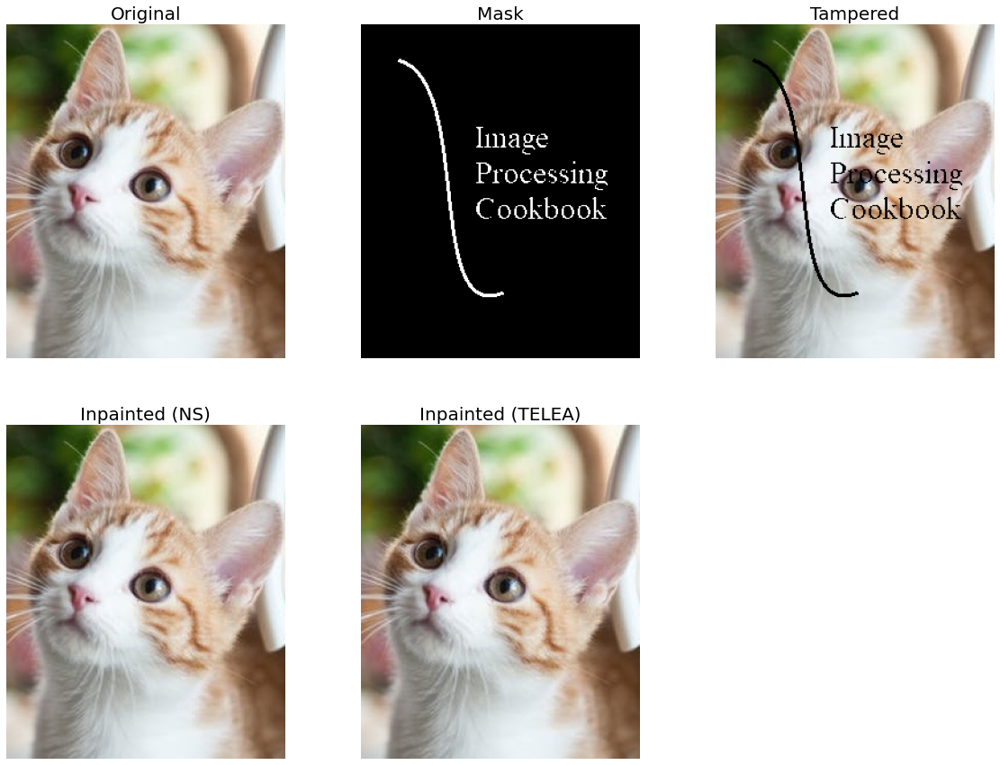

In [ ]:
import numpy as np
import cv2
import matplotlib.pylab as plt

# 1. Učitajte RGB fotografiju i fotografiju maske sivih tonova:
im = cv2.imread('images/cat.png') #, cv2.CV_8U
mask = cv2.imread('images/cat_mask.png',0)
# 2. Binarizujte fotografiju maske koristeći threshold(prag):
_, mask = cv2.threshold(mask, 100, 255, cv2.THRESH_BINARY)
# 3. 
"""
Uklonite zamaskirane piksele sa ulazne fotografije 
koristeći bitwise_and sa fotografijom binarne maske:
"""
src = cv2.bitwise_and(im, im, mask= mask)
#print(mask.shape, im.shape)
mask = cv2.bitwise_not(mask)
# 4.
"""
Uzmite obojenu odredišnu fotografiju vraćenu metodom cv2.inpaint()
koristeći cv2.INPAINT_NS algoritam:
"""
dst1 = cv2.inpaint(src, mask, 5, cv2.INPAINT_NS)

# 5.
"""
Uzmite obojenu odredišnu fotografiju vraćenu metodom cv2.inpaint()
koristeći cv2.INPAINT_TELEA algoritam:
"""
dst2 = cv2.inpaint(src, mask, 5, cv2.INPAINT_TELEA)
plt.figure(figsize=(20,15))
plt.gray()
plt.subplot(231), plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Original', size=20)
plt.subplot(232), plt.imshow(mask), plt.axis('off'), plt.title('Mask', size=20)
plt.subplot(233), plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Tampered', size=20)
plt.subplot(234), plt.imshow(cv2.cvtColor(dst1, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Inpainted (NS)', size=20)
plt.subplot(235), plt.imshow(cv2.cvtColor(dst2, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Inpainted (TELEA)', size=20)
plt.show()

### Image Inpainting with Convex Optimization // “Slikanje fotografije” pomoću konveksne optimizacije

Konveksna optimizacija je potpolje matematičke optimizacije koja proučava problem minimiziranja konveksnih funkcija preko konveksnih skupova.

Prilikom oslikavanja fotografije pomoću konveksne optimizacije potrebno je koristiti pyunlocbox biblioteku.

In [ ]:
!pip install pyunlocbox

     |████████████████████████████████| 51kB 4.1MB/s 


Solution found after 91 iterations:
    objective function f(sol) = 1.327656e+03
    stopping criterion: RTOL


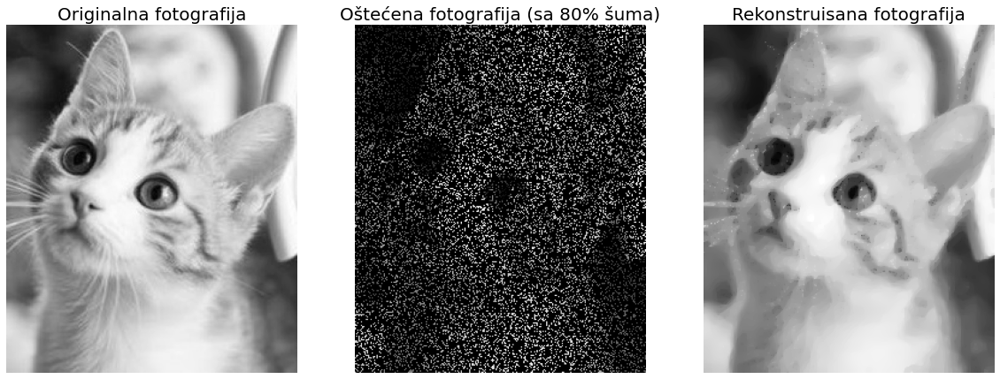

In [ ]:
#https://www.cvxpy.org/examples/applications/tv_inpainting.html
#https://pyunlocbox.readthedocs.io/en/stable/tutorials/reconstruction.html
from skimage.io import imread
from skimage.color import rgb2gray
from pyunlocbox import functions, solvers
import numpy as np
import matplotlib.pyplot as plt

# Učitajte ulaznu fotografiju i prebacite je u fotografiju sivih tonova
im_original = rgb2gray(imread('images/cat.png'))

"""
Generišite nasumičnu matricu maskiranja koja maskira 80% piksela, 
primenite je na fotografiju i pribavite oštećenu fotografiju:
"""
np.random.seed(1)  # Reproducible results.
mask = np.random.uniform(size=im_original.shape)
mask = mask > 0.8
g = lambda x: mask * x
im_corrupted = g(im_original)
"""
Prethodni cilj minimiziranja definisan je sa f1. 
f1(x)=∥x∥tv
Izrazite to pomoću funkcije functions.norm_tv:
"""
f1 = functions.norm_tv(maxit=50, dim=2)
"""
Postavite t parametar na veliku vrednost pošto verujemo svojim merenjima i želimo
da im rešenje bude blizu. Za noisy merenja, trebalo bi razmotriti nižu vrednost:
"""
tau = 100

# f2(x)=τ∥g(x)−y∥pow2 (na kvadrat)
f2 = functions.norm_l2(y=im_corrupted, A=g, lambda_=tau) 

"""
Na kraju, napravite instancu algoritma za podelu unapred-unazad i rešite
problem optimizacije metodom solvers.solve():
"""
solver = solvers.forward_backward(step=0.5/tau)
x0 = np.array(im_corrupted)  # Make a copy to preserve im_corrupted.
ret = solvers.solve([f1, f2], x0, solver, maxit=100)

fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(im_original, cmap='gray')
ax[0].set_title("Originalna fotografija", size=20)
ax[0].axis('off')
ax[1].imshow(im_corrupted, cmap='gray')
ax[1].set_title("Oštećena fotografija (sa 80% šuma)", size=20)
ax[1].axis('off')
ax[2].imshow(ret['sol'], cmap='gray')
ax[2].set_title("Rekonstruisana fotografija", size=20)
ax[2].axis('off')
plt.show()

### Steganography and Steganalysis // Steganografija i steganaliza

Steganografija ima za cilj da poruku (koja se naziva stego tekst) neprimetno sakrije na ulaznoj fotografiji (poznatoj kao naslovna fotografija) što rezultira izlaznom stego fotografijom (bez vidljivog izobličenja), tako da se ne sumnja u postojanje poruke. Pruža sigurnost putem nejasnoća i koristi se za tajno prenošenje poruka između pošiljaoca i primaoca. Steganografija skriva poruku tako da ju je teško posmatrati, za razliku od kriptografije koja šifrira poruku tako da je teško (računski) dešifrovati ili razumeti. 

Suprotno tome, steganaliza se odnosi na proces otkrivanja tajnih poruka koje su skrivene pomoću steganografije (kriptoanaliza ima sličan odnos sa kriptografijom).

Vrlo popularna steganografska tehnika je LSB skrivanje podataka u RGB fotografiji u boji i tehnikama steganalize za otkrivanje tajnih poruka. Tajne poruke se mogu sakriti skladištenjem informacija u najmanje značajne bitove fotografije. Na ovaj način, promena vrednosti piksela je najviše jedna, a samim tim i stego fotografija ostaje neprimetna od strane ljudskog oka.


*   Funkcija *lsb.hide()* je korišćena za LSB sakrivanje podataka, koja uzima naslovnu fotografiju i stego tekst kao ulazne parametre i vraća stego fotografiju.
*   Funkcija *lsb.reveal()* je korišćena za vraćanje stego teksta sa stego fotografije.
*   Funkcija *parity.steganalyse()* je korišćena za dobijanje fotografije kodirane paritetom sa fotografije (stego i naslovne).
*   Funkcija *difference()* iz *PIL ImageChop-a* je korišćena za izračunavanje razlike fotografije između dve ulazne fotografije(na primer, stego i naslovne).
*   Funkcija *statistics.steganalyse()* vraća vrednosti piksela sa frekvencijama (histogram) gde se naslovna i stego fotografija razlikuju u frekvenciji.








In [ ]:
!pip install stegano

     |████████████████████████████████| 307kB 8.5MB/s 
     |████████████████████████████████| 2.1MB 11.6MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [ ]:
#!pip install Stegano
import stegano
from PIL import Image, ImageChops
from stegano import lsb, lsbset
from stegano.steganalysis import statistics, parity
import matplotlib.pylab as plt

#1.
"""
Učitajte (naslovnu) fotografiju i sakrijte dugu poruku (spajanjem poruke 10
puta) unutar fotografije. Sačuvajte stego fotografiju:
"""
cover = Image.open('images/lena.png').convert('RGB')
stego = lsb.hide("images/lena.png", 10*"Python Image Processing Cookbook - LSB data hiding with Stegano").convert('RGB')
stego.save("images/lena-secret.png")
# 2. Odštampajte poruku skrivenu u stego slici:
print(lsb.reveal("images/lena-secret.png"))
# 3.
"""

Napravite paritetnu steg-analizu i izvucite paritetno kodirane naslovnice i stego fotografije.
Zatim koristite statističku steg-analizu da biste pronašli zajedničku naslovnu i stego fotografiju:
"""
parity_encoded_cover = parity.steganalyse(cover)
parity_encoded_stego = parity.steganalyse(stego)
_, cover_common = statistics.steganalyse(cover)
_, stego_common = statistics.steganalyse(stego)

Python Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with Stegano


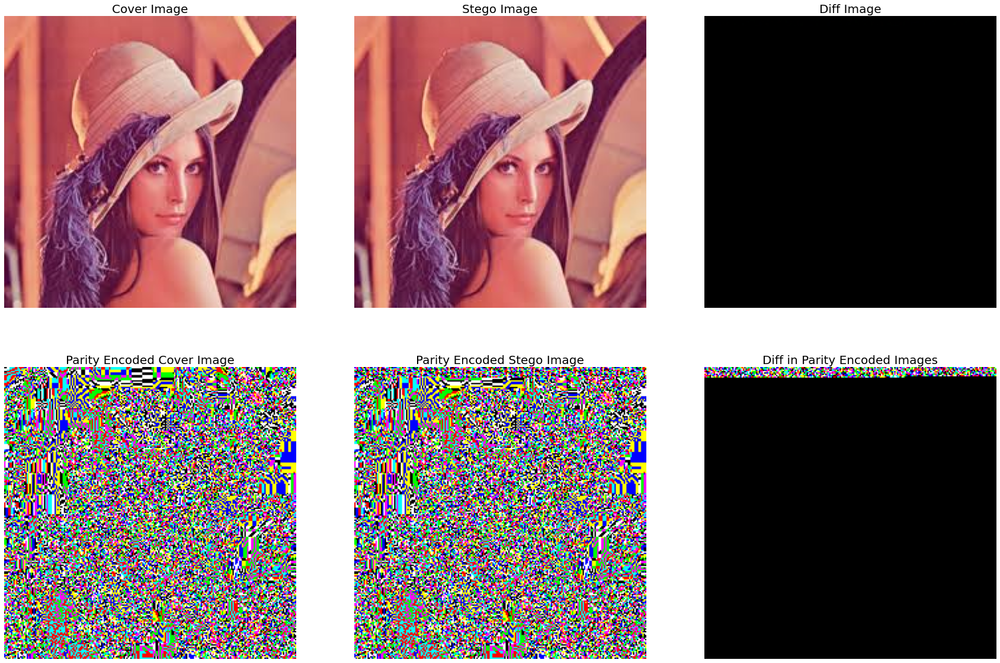

In [ ]:
plt.figure(figsize=(30,20))
plt.subplot(231), plt.imshow(cover), plt.axis('off'), plt.title('Cover Image', size=20)
plt.subplot(232), plt.imshow(stego), plt.axis('off'), plt.title('Stego Image', size=20)
plt.subplot(233), plt.imshow(ImageChops.difference(stego, cover)), plt.axis('off'), plt.title('Diff Image', size=20)
plt.subplot(234), plt.imshow(parity_encoded_cover), plt.axis('off'), plt.title('Parity Encoded Cover Image', size=20)
plt.subplot(235), plt.imshow(parity_encoded_stego), plt.axis('off'), plt.title('Parity Encoded Stego Image', size=20)
plt.subplot(236), plt.imshow(ImageChops.difference(parity_encoded_stego, parity_encoded_cover)), plt.axis('off'), plt.title('Diff in Parity Encoded Images', size=20)
plt.show()

Kao što možete videti iz prethodnog primera, razliku u
fotografijama, između stego i naslovne fotografije.
Postojanje tajne poruke ne može se detektovati. 
Parity-encoded stego i naslovna fotografija nisu identične i
razlika fotografija otkriva da postoji neka tajna poruka ugrađena u
stego fotografiju.

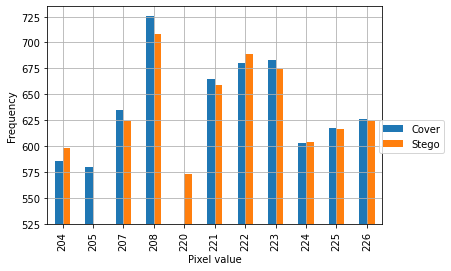

In [ ]:
import pandas as pd
# 4.
"""
Definišite plot_freq() funkciju za crtanje histograma (uobičajenog piksela
frekvencije) gde se razlikuju naslovne i stego fotografije (dobijene ranije sa
statističkom steg-analizom):
"""
def plot_freq(cover_common, stego_common):
    pixel_freq = list(zip(*cover_common))
    pixel = pixel_freq[0]
    freq = pixel_freq[1]
    df1 = pd.DataFrame({'Pixel':pixel, 'Freq':freq, 'Group':'Cover'})
    pixel_freq = list(zip(*stego_common))
    pixel = pixel_freq[0]
    freq = pixel_freq[1]
    df2 = pd.DataFrame({'Pixel':pixel, 'Freq':freq, 'Group':'Stego'})
    df = pd.concat([df1, df2])
    df.pivot("Pixel", "Group", "Freq").plot(kind='bar').legend(bbox_to_anchor=(1.2, 0.5))
    plt.xlabel('Pixel value')
    plt.ylabel('Frequency')
    plt.ylim((525, 735))
    plt.grid()
    plt.show()
"""
Dobićete izlaz, koji jasno pokazuje
da su stego i naslovna fotografija različite:
"""
plot_freq(cover_common, stego_common)

In [ ]:
cover_common

[(208, 726),
 (223, 683),
 (222, 680),
 (221, 665),
 (207, 635),
 (226, 626),
 (225, 617),
 (224, 603),
 (204, 586),
 (205, 580)]

In [ ]:
stego_common

[(208, 708),
 (222, 689),
 (223, 674),
 (221, 659),
 (226, 624),
 (207, 624),
 (225, 616),
 (224, 604),
 (204, 598),
 (220, 573)]

(220, 220) (220, 220)


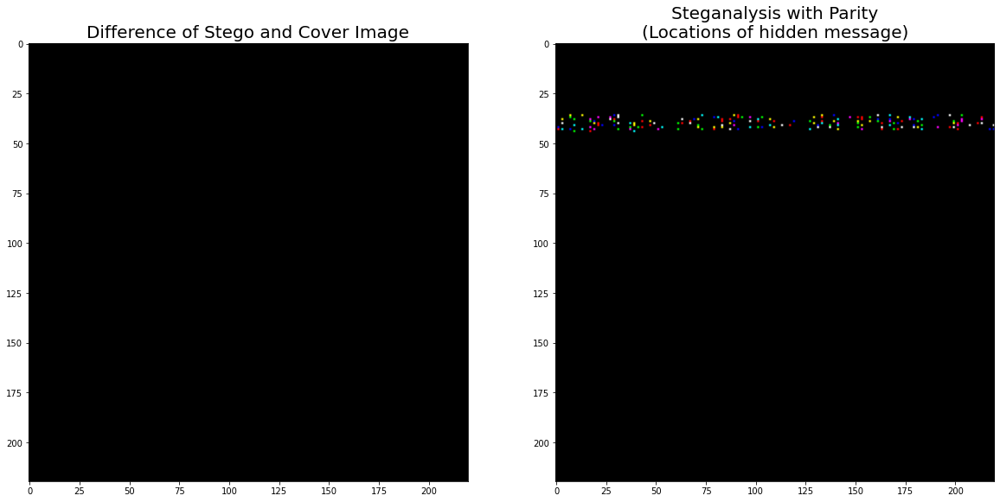

Could not decode with the generator provided!


'Python Image Processing Cookbook - LSB data hiding with Stegano lsbset!'

In [ ]:
from stegano import lsbset
from stegano.lsbset import generators

# 5.
"""
Dalje, koristite LSB tehniku sa skupovima zasnovanim na generatorima (sito Eratostena)
da sakrijete tajnu poruku:
"""
cover = Image.open("images/lena.png").convert('RGB')
# Hide a secret with the Sieve of Eratosthenes
secret_message = "Python Image Processing Cookbook - LSB data hiding with Stegano lsbset!"
n = 1000
stego = lsbset.hide("images/lena.png",
                                secret_message,
                                generators.eratosthenes(),
                                shift = n).convert('RGB')
stego.save("images/stego.png")
print(stego.size, cover.size)

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(ImageChops.difference(stego, cover), cmap='hot')
plt.title('Difference of Stego and Cover Image', size=20)
plt.subplot(122)
plt.imshow(ImageChops.difference(parity.steganalyse(stego), parity.steganalyse(cover)), cmap='hot')
plt.title('Steganalysis with Parity\n(Locations of hidden message)', size=20)
plt.show()

# 6.
"""
Sada pokušajte da preuzmete skrivenu poruku koristeći isti generator:
"""
try:
    # Try to decode with another generator
    message = lsbset.reveal("images/stego.png", generators.fibonacci(), shift = n)
except:
    print('Could not decode with the generator provided!')
    
message = lsbset.reveal("images/stego.png", generators.eratosthenes(), shift = n)
message

In [ ]:
from stegano import exifHeader
# 7.
"""
Konačno, za JPEG i TIFF fotografije možete sakriti poruku u exifHeader
(i otkrijte ga) pomoću sledećeg koda:
"""
secret = exifHeader.hide("images/butterfly.jpg", "images/stego.png", secret_message=5*"Python Image Processing Cookbook - LSB data hiding with Stegano")
print(exifHeader.reveal("images/stego.png"))

b'Python Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with SteganoPython Image Processing Cookbook - LSB data hiding with Stegano'


### Image Restoration with Dictionary Learning // Restauracija fotografije pomoću *Dictionary Learning*


*Dictionary Learning* (takođe poznato kao retko kodiranje) predstavlja tehniku učenja koja predstavlja pokušaj pronalaženja retke reprezentacije ulaznih podataka kao (retke) linearne kombinacije osnovnih elemenata (poznatih kao atomi) koji grade prekomerni opsežni skup (poznat kao rečnik).

Kod obrade fotografija, učenje rečnika primenjeno je na zakrpama fotografija i pokazalo je obećavajuće rezultate u različitim problemima obrade fotografija, kao što su “slikanje fotografije”,
kompletiranje fotografije i izoštravanje fotografije.

Koristićemo *Dictionary Learning* za izoštravanje slika.

Distorting image...
Extracting reference patches...
done in 0.02s.
Learning the dictionary...
done in 23.05s.


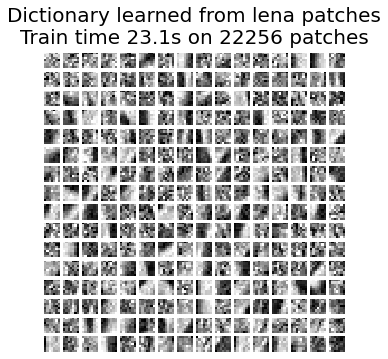

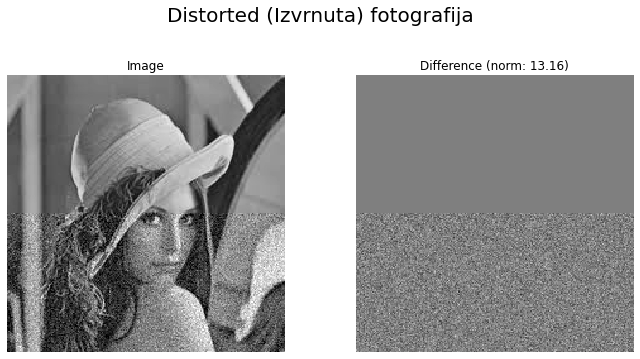

Extracting noisy patches... 
done in 0.01s.
Orthogonal Matching Pursuit
2 atoms...
done in 5.28s.


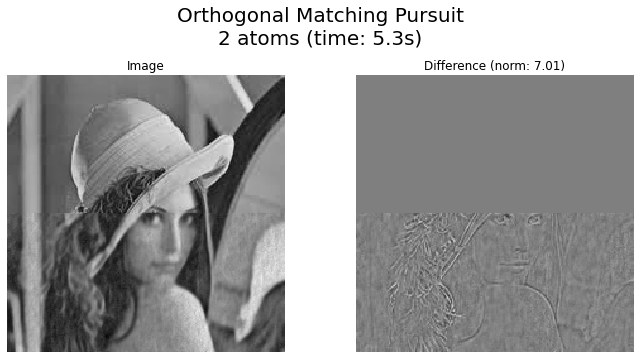

In [ ]:
"""
U ovom primeru koristićemo fotografiju sivih nijanci Lene za rekonstrukciju 
pomoću rečnika učenja. 
Počnimo sa unosom potrebnih biblioteka i relevantnih modula:
"""
from skimage.io import imread
from skimage.color import rgb2gray
from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.feature_extraction.image import extract_patches_2d
from sklearn.feature_extraction.image import reconstruct_from_patches_2d
import numpy as np
import matplotlib.pylab as plt
from time import time

# 1.
"""
Učitajte fotografiju Lene i degradirajte(oštetite) donju polovinu fotografije
nasumičnim Gausovim šumom zadržavajući gornju polovinu onakvom kakva jeste:
"""
lena = rgb2gray(imread('images/lena.png'))
#print(lena.shape, lena.dtype, np.max(lena))
height, width = lena.shape

# Distort the lower half of the image
print('Distorting image...')
distorted = lena.copy()
distorted[height // 2:, :] += 0.085 * np.random.randn(height // 2, width)

#2.
"""
Izdvojite svaki referentni segment 7x7 iz gornje polovine fotografije. 
Izračunajte srednju i standardnu devijaciju izvađenih segmenata 
i normalizujte izdvojene segmente:
"""
print('Extracting reference patches...')
t0 = time()
patch_size = (7, 7)
data = extract_patches_2d(distorted[height // 2:, :], patch_size)
data = data.reshape(data.shape[0], -1)
data -= np.mean(data, axis=0)
data /= np.std(data, axis=0)
print('done in %.2fs.' % (time() - t0))

# 3.
"""
Naučite rečnik (sa 256 komponenti) iz izvučenih referentnih segmenata:
"""
print('Learning the dictionary...')
t0 = time()
dico = MiniBatchDictionaryLearning(n_components=256, alpha=1, n_iter=600)
V = dico.fit(data).components_
dt = time() - t0
print('done in %.2fs.' % dt)

"""
Iscrtajte komponente rečnika naučene iz segmenata.
"""
plt.figure(figsize=(5, 5))
for i, comp in enumerate(V):
    plt.subplot(16, 16, i + 1)
    plt.imshow(comp.reshape(patch_size), cmap=plt.cm.gray_r, interpolation='nearest')
    plt.axis('off')
plt.suptitle('Dictionary learned from lena patches\n' +
             'Train time %.1fs on %d patches' % (dt, len(data)),
             fontsize=20)
plt.subplots_adjust(0.08, 0.02, 0.92, 0.85, 0.08, 0.23)


# #############################################################################
# Display the distorted image
# 4.
"""
Definišite funkciju show_with_diff() i pozovite je da pokaže izvrnutu fotografiju:
"""
def show_with_diff(image, reference, title):
    """Helper function to display denoising"""
    plt.figure(figsize=(10, 5))
    plt.subplot(121), plt.title('Image')
    plt.imshow(image, vmin=0, vmax=1, cmap=plt.cm.gray, interpolation='nearest')
    plt.axis('off')
    plt.subplot(122)
    difference = image - reference
    plt.title('Difference (norm: %.2f)' % np.sqrt(np.sum(difference ** 2)))
    plt.imshow(difference, vmin=-0.5, vmax=0.5, cmap=plt.cm.gray_r, interpolation='nearest')
    plt.axis('off')
    plt.suptitle(title, size=20)
    plt.subplots_adjust(0.02, 0.02, 0.98, 0.79, 0.02, 0.2)
    plt.show()

show_with_diff(distorted, lena, 'Distorted (Izvrnuta) fotografija')

# #############################################################################
# Extract noisy patches and reconstruct them using the dictionary
# 5.
"""
Izdvojite segmente iz donje polovine, sa šumom, fotografije i normalizujte
izvučene segmente šuma:
"""
print('Extracting noisy patches... ')
t0 = time()
data = extract_patches_2d(distorted[height // 2:, :], patch_size)
data = data.reshape(data.shape[0], -1)
intercept = np.mean(data, axis=0)
data -= intercept
print('done in %.2fs.' % (time() - t0))

# 6.
"""
Rekonstruišite donju polovinu (sa šumom) fotografije pomoću rečnika
komponente (atoma):
"""
print('Orthogonal Matching Pursuit\n2 atoms' + '...')
kwargs = {'transform_n_nonzero_coefs': 2}
reconstruction = lena.copy()
t0 = time()
dico.set_params(transform_algorithm='omp', **kwargs)
code = dico.transform(data)
patches = np.dot(code, V)
patches += intercept
patches = patches.reshape(len(data), *patch_size)
reconstruction[height // 2:, :] = reconstruct_from_patches_2d(patches, (height // 2, width))
dt = time() - t0

print('done in %.2fs.' % dt)
show_with_diff(reconstruction, lena, 'Orthogonal Matching Pursuit\n2 atoms (time: %.1fs)' % dt)

### Image Compression with Wavelets // Kompresija (sabijanje) fotografije pomoću *Wavelets*


Kompresija fotografije predstavlja kompresiju podataka koja izvornu fotografiju kodira sa nekoliko bitova. Cilj kompresije fotografije je da smanji redundanciju fotografije i da sačuva ili prenese podatke u efikasnom obliku.

Prikazaćemo kako pomoću talasa transformisati fotografiju i odbaciti bitove nižeg reda sa izlaza transformacije, tako da je većina njenih vrednosti nula (ili vrlo mala), ali većina signala (pikseli) su sačuvani. Za demonstraciju ćemo koristiti funkcije biblioteke *mahotas*.

In [ ]:
!pip install mahotas

     |████████████████████████████████| 5.7MB 8.9MB/s 


(256, 256)
Fraction of zeros in original image: 0.00311279296875
Fraction of zeros in original image (after division by 8): 0.024658203125
Fraction of zeros in wavelet transform (after division by 8): 0.8889007568359375
(512, 512)


/usr/local/lib/python3.7/dist-packages/mahotas/convolve.py:479: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  nimage[position] = f
/usr/local/lib/python3.7/dist-packages/mahotas/convolve.py:510: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return w[position]


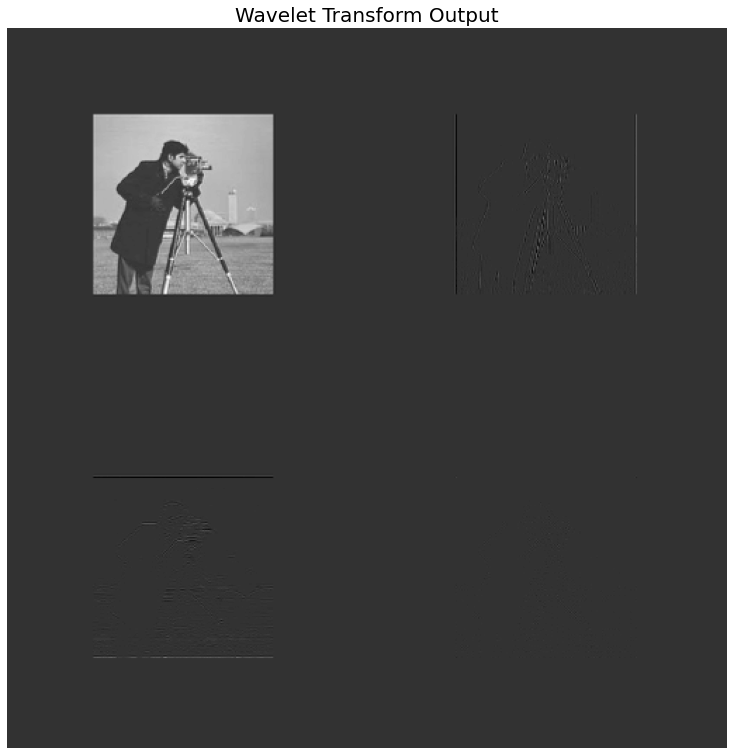

Fraction of zeros in wavelet transform (after division by 8 & soft thresholding): 0.9455070495605469


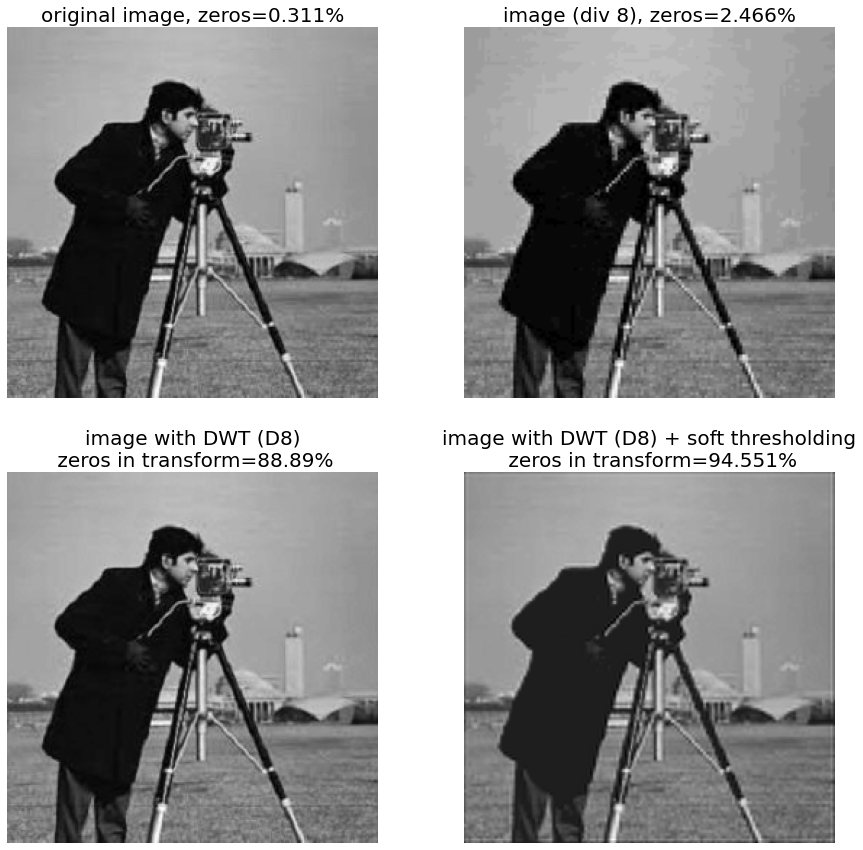

In [ ]:
# https://mahotas.readthedocs.io/en/latest/wavelets.html
import numpy as np
import mahotas
from mahotas.thresholding import soft_threshold
from matplotlib import pyplot as plt
import os

"""
Učitajte ulaznu fotografiju i pretvorite je u sivu:
"""
im = mahotas.imread('images/cameraman.png', as_grey=True)
im = im.astype(np.uint8)
print(im.shape)
f = np.mean(im==0)
print("Fraction of zeros in original image: {}".format(f))

"""
Isprobajte osnovnu metodu kompresije koristeći jednostavno uzorkovanje 
(čuvanjem svakog drugog piksela) i čuvanjem samo bitova visokog reda:
"""
im1 = im[::2,::2].copy()
im1 = im1 / 8
im1 = im1.astype(np.uint8)
f1 = np.mean(im1==0)
print("Fraction of zeros in original image (after division by 8): {}".format(f1))

# Transform using D8 Wavelet to obtain transformed image imw
"""
Iako ste bacili 75% vrednosti sa fotografije u prethodnom koraku, 
i dalje postoji samo nekoliko nula. 
Transformišite fotografiju koristeći Daubechies-ov talas (D8),
a zatim odbacite bitove niskog reda. 
Proverite da li ste dobili bolju fotografiju sa istim brojem upotrebljenih vrednosti:
"""
imw = mahotas.daubechies(mahotas.wavelet_center(im),'D8')
# Discard low-order bits:
imw /= 8
imw = imw.astype(np.int8)
mahotas.imsave('images/cameraman_D8.png', (imw - np.min(imw)).astype(np.uint8))
f2 = np.mean(imw==0)
print("Fraction of zeros in wavelet transform (after division by 8): {}".format(f2))
im2 = mahotas.wavelet_decenter(mahotas.idaubechies(imw, 'D8'), im.shape)
im2 = (255 * (im2 - np.min(im2)) / (np.max(im2) - np.min(im2))).astype(np.uint8) # min-max normalization

print(imw.shape)
plt.figure(figsize=(10,10))
plt.imshow(imw), plt.axis('off'), plt.title('Wavelet Transform Output', size=20)
plt.subplots_adjust(0,0,1,1,0.01,0.01)
plt.show()

"""
Primenite meko pragovanje(soft-thresholding) 
da biste dalje povećali procenat nula u transformisanoj fotografiji:
"""
imw = soft_threshold(imw, 12)
f3 = np.mean(imw==0)
print("Fraction of zeros in wavelet transform (after division by 8 & soft thresholding): {}".format(f3))
#imw = imw.astype(np.int8)
im3 = mahotas.wavelet_decenter(mahotas.idaubechies(imw, 'D8'), im.shape)
im3 = (255 * (im3 - np.min(im3)) / (np.max(im3) - np.min(im3))).astype(np.uint8) # min-max normalization

plt.figure(figsize=(15,15))
plt.gray()
# Show the data:
plt.subplot(221), plt.imshow(im), plt.axis('off')
plt.title('original image, zeros={}%'.format(np.round(100*f, 3)), size=20)
plt.subplot(222), plt.imshow(im1), plt.axis('off')
plt.title('image (div 8), zeros={}%'.format(np.round(100*f1, 3)), size=20)
plt.subplot(223), plt.imshow(im2), plt.axis('off')
plt.title('image with DWT (D8)\n zeros in transform={}%'.format(np.round(100*f2, 3)), size=20)
plt.subplot(224), plt.imshow(im3), plt.axis('off')
plt.title('image with DWT (D8) + soft thresholding\n zeros in transform={}%'.format(np.round(100*f3, 3)), size=20)
plt.show()

## Dodatni primeri

### Online Dictionary Learning

Koristi MiniBatchDictionaryLearning objekat.


In [ ]:
from skimage.io import imread
from skimage.color import rgb2gray
from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.feature_extraction.image import extract_patches_2d
from sklearn.feature_extraction.image import reconstruct_from_patches_2d
import numpy as np
import matplotlib.pylab as plt
from time import time

def show_with_diff2(image, reference, V, errors, title, epoch, batch):
    """Helper function to display denoising"""

    difference = image - reference
    
    plt.figure(figsize=(5,5))
    for i, comp in enumerate(V):
        plt.subplot(16, 16, i + 1)
        plt.imshow(comp.reshape(patch_size), cmap=plt.cm.gray_r, interpolation='nearest')
        plt.axis('off')
    plt.suptitle('Dictionary learned from lena patches\n' +
                 'Train time %.1fs on %d patches' % (dt, len(data)),
                 fontsize=20)
    plt.subplots_adjust(0.08, 0.02, 0.92, 0.85, 0.08, 0.23)
    plt.savefig('images/dict_{:d}_{:03d}.png'.format(epoch, batch))
    plt.close()
    
    plt.figure(figsize=(20, 20))
    plt.subplot(221), plt.title('Dictionary', size=20)
    plt.imshow(imread('images/dict_{:d}_{:03d}.png'.format(epoch, batch)), cmap=plt.cm.gray, interpolation='nearest')
    plt.axis('off')
    
    plt.subplot(222), plt.title('Reconstructed Image', size=20)
    plt.imshow(image, vmin=0, vmax=1, cmap=plt.cm.gray, interpolation='nearest')
    plt.axis('off')
    
    plt.subplot(223)
    plt.title('Difference = Reconstructed - Original (norm: %.2f)' % error, size=20)
    plt.imshow(difference, vmin=-0.5, vmax=0.5, cmap=plt.cm.gray_r, interpolation='nearest')
    plt.axis('off')
    
    print(len(errors))
    plt.subplot(224), plt.title('Error (w.r.t Original)', size=20)
    plt.plot(range(len(errors)), errors, 'r.-')
    plt.xlabel('Batches (every 10)')
    plt.ylabel('Norm of Difference')
    plt.xticks(range(len(errors)+1))
    
    plt.suptitle(title, size=30)
    plt.subplots_adjust(0.02, 0.02, 0.98, 0.9, 0.02, 0.2)
    plt.savefig('images/out_{:d}_{:03d}.png'.format(epoch, batch))
    plt.show()

lena = rgb2gray(imread('images/lena.png'))
#print(lena.shape, lena.dtype, np.max(lena))
height, width = lena.shape

# Distort the right half of the image
print('Distorting image...')
distorted = lena.copy()
distorted[height // 2:, :] += 0.085 * np.random.randn(height // 2, width)

# Extract all reference patches from the left half of the image
print('Extracting reference patches...')
t0 = time()
patch_size = (7, 7)
data = extract_patches_2d(distorted[height // 2:, :], patch_size)
data = data.reshape(data.shape[0], -1)
data -= np.mean(data, axis=0)
data /= np.std(data, axis=0)
print('done in %.2fs.' % (time() - t0))

# #############################################################################
# Learn the dictionary from reference patches

print('Learning the dictionary...')
batch_size = 128 #128 #32
n_epochs = 2 #10 # 20
n_batches = len(data) // batch_size
print(n_batches) 

t0 = time()
dico = MiniBatchDictionaryLearning(n_components=256, alpha=1, n_iter=1, batch_size=batch_size)
print('Extracting noisy patches... ')
noisy_data = extract_patches_2d(distorted[height // 2:, :], patch_size)
noisy_data = noisy_data.reshape(noisy_data.shape[0], -1)
intercept = np.mean(noisy_data, axis=0)
noisy_data -= intercept
print('done in %.2fs.' % (time() - t0))

n_updates = 0
errors = []
for epoch in range(n_epochs):
    for i in range(n_batches):
        batch = data[i * batch_size: (i + 1) * batch_size]
        dico.partial_fit(batch)
        V = dico.components_
        n_updates += 1
        if n_updates % 10 == 0:
            print('Orthogonal Matching Pursuit\n2 atoms (batch size = 128), epoch={}, batch={}'.format(epoch+1, i+1))
            kwargs = {'transform_n_nonzero_coefs': 2}
            reconstruction = lena.copy()
            t0 = time()
            dico.set_params(transform_algorithm='omp', **kwargs)
            code = dico.transform(noisy_data)
            patches = np.dot(code, V)
            patches += intercept
            patches = patches.reshape(len(data), *patch_size)
            reconstruction[height // 2:, :] = reconstruct_from_patches_2d(patches, (height // 2, width))
            error = np.sqrt(np.sum((lena - reconstruction) ** 2))
            errors.append(error)
            print('error={}'.format(error))
            dt = time() - t0
            print('done in %.2fs.' % dt)
            if n_updates % 100 == 0:
                show_with_diff2(reconstruction, lena, V, errors,
                   'Orthogonal Matching Pursuit with2 atoms {:.01f}s\n Minibatch Dictionary Learning: epoch={}, batch={}'
                    .format(dt, epoch+1, i+1), epoch+1, i+1)
            
dt = time() - t0
print('done in %.2fs.' % dt)

plt.figure(figsize=(5, 5))
for i, comp in enumerate(V):
    plt.subplot(16, 16, i + 1)
    plt.imshow(comp.reshape(patch_size), cmap=plt.cm.gray_r, interpolation='nearest')
    plt.axis('off')
plt.suptitle('Dictionary learned from lena patches\n' +
             'Train time %.1fs on %d patches' % (dt, len(data)),
             fontsize=20)
plt.subplots_adjust(0.08, 0.02, 0.92, 0.85, 0.08, 0.23)

### Image Completion with Inpainting (using Deep learning - pre-trained torch CompletionNet model) // Dopunjavanje fotografije putem “slikanja fotografije”

*Fully-Convolutional deep learning Network* (FCN) je neuronska mreža koja vrši samo operacije konvolucije (i poduzorkovanja ili ponovnog uzorkovanja).

*Fully-Convolutional deep learning Network* (FCN) se može koristiti za dovršavanje nedostajućih delova fotografija. Konkretno ćemo koristiti unapred obučenu verziju modela neuronske mreže za predviđanje delova koji nedostaju na fotografiji. Model će prihvatiti ulaznu fotografiju i masku (koja odgovara delovima koji nedostaju na fotografiji) i pokušaće da predvidi delove koji nedostaju na osnovu podataka koje pruža preostala (nepotpuna) fotografija.


In [ ]:
!pip install torch==0.4.1

In [ ]:
!wget --continue -O completionnet_places2.t7 http://hi.cs.waseda.ac.jp/~iizuka/data/completionnet_places2.t7

In [ ]:
# https://github.com/akmtn/pytorch-siggraph2017-inpainting

# must be run with pytorch version 0.4.1
# download the wheels from here: https://download.pytorch.org/whl/cpu/torch_stable.html
# pip install torch-0.4.1-cp37-cp37m-win_amd64.whl # --force-reinstall
# pip install "torchvision-0.4.1+cpu-cp37-cp37m-win_amd64.whl" # --force-reinstall
import os
import torch
from torch.legacy import nn 
from torch.legacy.nn.Sequential import Sequential
import cv2
import numpy as np
from torch.utils.serialization import load_lua
import matplotlib.pylab as plt


def tensor2image(src):
    out = src.copy() * 255
    out = out.transpose((1, 2, 0)).astype(np.uint8)
    out = cv2.cvtColor(out, cv2.COLOR_RGB2BGR)
    return out

def image2tensor(src):
    out = src.copy()
    out = cv2.cvtColor(out, cv2.COLOR_BGR2RGB)
    out = out.transpose((2,0,1)).astype(np.float64) / 255
    return out

image_path = 'images/zebra.png'
mask_path = 'images/inpaint_mask.png'
# download model from http://hi.cs.waseda.ac.jp/~iizuka/data/completionnet_places2.t7
model_path = 'completionnet_places2.t7'
gpu = torch.cuda.is_available()

# load Completion Network
#data = torchfile.load(model_path,force_8bytes_long=True)

#data = load_lua(model_path, long_size=8)
data = load_lua(model_path)
model = data.model
model.evaluate()

# load data
image = cv2.imread(image_path)
image = cv2.resize(image, (4*(image.shape[0]//4), 4*(image.shape[1]//4)))
I = torch.from_numpy(image2tensor(image)).float()

mask = cv2.imread(mask_path)
mask = cv2.resize(mask, (4*(mask.shape[0]//4), 4*(mask.shape[1]//4)))
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY) / 255
mask[mask <= 0.5] = 0.0
mask[mask > 0.5] = 1.0
#print(input.shape, mask.shape)
M = torch.from_numpy(mask).float()
M = M.view(1, M.size(0), M.size(1))
assert I.size(1) == M.size(1) and I.size(2) == M.size(2)

for i in range(3):
    I[i, :, :] = I[i, :, :] - data.mean[i]

# create mask_3ch
M3 = torch.cat((M, M, M), 0)

im = I * (M3*(-1)+1)

# set up input
input = torch.cat((im, M), 0)
input = input.view(1, input.size(0), input.size(1), input.size(2)).float()

if gpu:
    print('using GPU...')
    model.cuda()
    input = input.cuda()

# evaluate
res = model.forward(input)[0].cpu()

# make out
for i in range(3):
    I[i, :, :] = I[i, :, :] + data.mean[i]

out = res.float()*M3.float() + I.float()*(M3*(-1)+1).float()

image[mask > 0.5] = 255
plt.figure(figsize=(20,35))
plt.subplots_adjust(left=0, right=1, top=0.9, bottom=0, wspace=0.05, hspace=0.05)
plt.subplot(211), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Incomplete Image', size=20)
plt.subplot(212), plt.imshow(cv2.cvtColor(tensor2image(out.numpy()), cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Completed Image (with CompletionNet)', size=20)
#plt.savefig('inpainting_out.png', bbox_in='tight', pad_in=0)
plt.show()

print('Done')

## Korisni linkovi

* [pytorch-siggraph2017-inpainting](https://github.com/akmtn/pytorch-siggraph2017-inpainting)

* [Data Hiding Techniques Using Prime and
Natural Numbers](https://arxiv.org/pdf/1003.3672.pdf)



## Reference


1.   [Python Image Processing Cookbook](https://www.amazon.com/Python-Image-Processing-Cookbook-processing-ebook/dp/B084ZN7Y5F), Sandipan Dey



## TO DO

**Zadatak 1**

Koristite različite vrednosti parametra regularizacije (od male vrednosti kao što je 0 do visoke vrednosti kao što je 100) za CLS filter i posmatrajte kako se menja obnovljeni kvalitet slike.

Uporedite filtere Viener i CLS za obnavljanje degradirane slike sa zamućenjem pokreta (na primer, sledeća slika knjige). Dobićete izlaz kao na sledećem snimku ekrana (takođe koristite MSE metriku za testiranje kvaliteta slike):

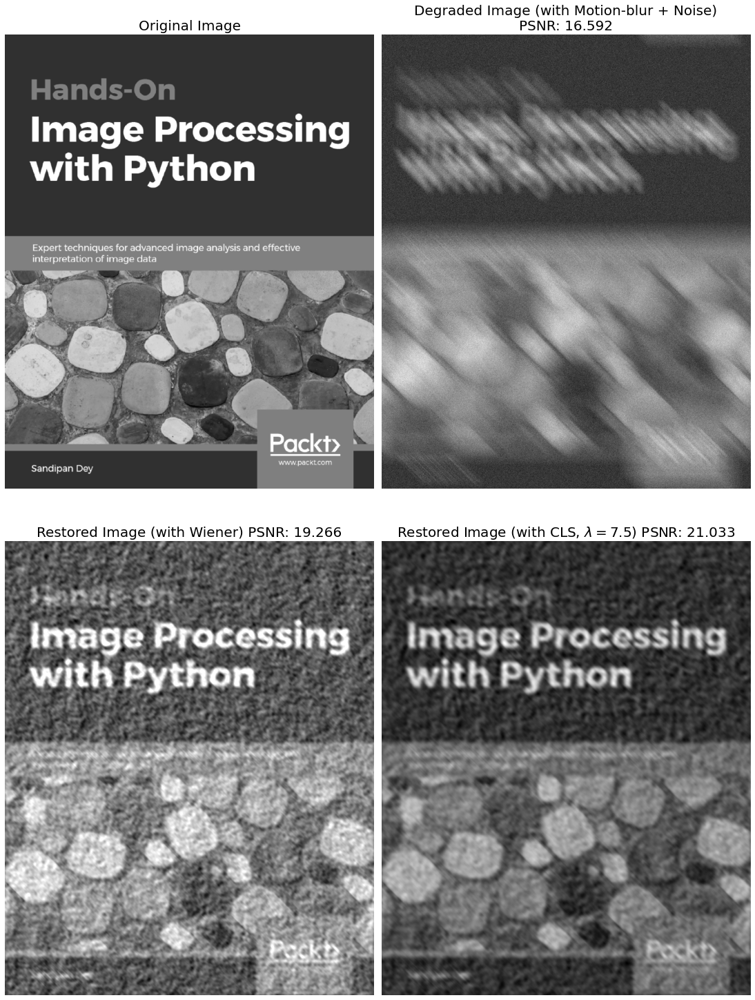

In [ ]:
# TO DO ... - uraditi zadatak